## Hoja de Trabajo # 1

In [1]:
#Importación de librerías
import cv2
import numpy as np
import matplotlib.pyplot as plt
import skimage.color
import skimage.io

### Problema 1

In [2]:
pip install pillow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [7]:
from PIL import Image

def activar_canales(imagen, color):
    # Abrir la imagen
    img = Image.open(imagen)
    # Convertir la imagen a RGB
    img = img.convert("RGB")
    # Obtener los datos de la imagen
    datos = img.load()

    # Recorrer cada píxel de la imagen
    for y in range(img.size[1]):
        for x in range(img.size[0]):
            r, g, b = datos[x, y]

            if color == 1:
                # Activar solo el canal azul
                datos[x, y] = (0, 0, b)
            elif color == 2:
                # Activar solo el canal verde
                datos[x, y] = (0, g, 0)
            elif color == 3:
                # Activar solo el canal rojo
                datos[x, y] = (r, 0, 0)
            elif color == 10:
                # Activar los canales rojo y verde
                datos[x, y] = (r, g, 0)
            elif color == 20:
                # Activar los canales verde y azul
                datos[x, y] = (0, g, b)
            elif color == 30:
                # Activar los canales azul y rojo
                datos[x, y] = (r, 0, b)

    # Devolver la imagen modificada
    return img

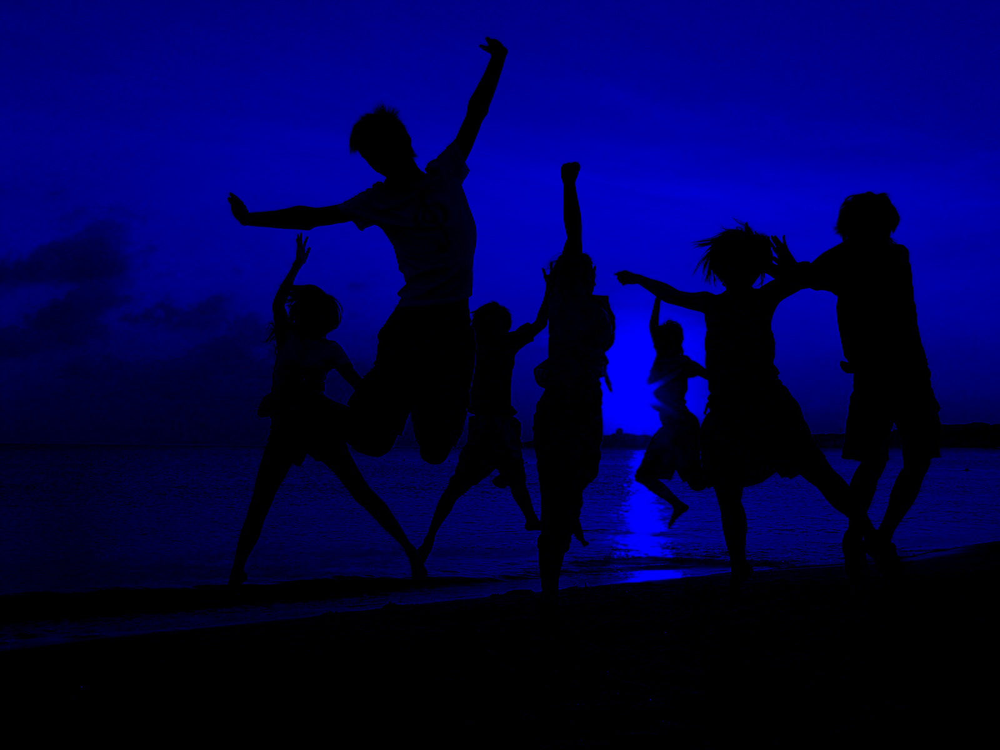

In [8]:
# Ejemplo de uso
imagen_modificada = activar_canales("imagen.jpg", 1)
imagen_modificada

### Problema 2

Reconstrucción de imagen1_salida_gray

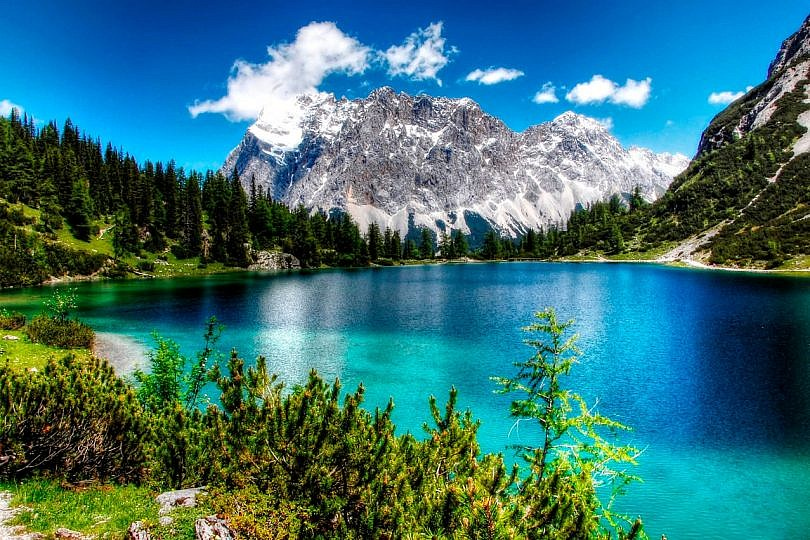

In [23]:
from PIL import Image

def reconstruir_imagen_color(imagen1_salida_gray_rojo, imagen1_salida_gray_verde, imagen1_salida_gray_azul):
    # Abrir las imágenes en escala de grises
    img1 = Image.open(imagen1_salida_gray_rojo).convert("L")
    img2 = Image.open(imagen1_salida_gray_verde).convert("L")
    img3 = Image.open(imagen1_salida_gray_azul).convert("L")

    # Crear una nueva imagen RGB con el mismo tamaño
    img_color = Image.merge("RGB", (img1, img2, img3))

    # Devolver la imagen reconstruida
    return img_color

# Ejemplo de uso
imagen_color = reconstruir_imagen_color("imagen1_salida_gray_rojo.jpg", "imagen1_salida_gray_verde.jpg", "imagen1_salida_gray_azul.jpg")
imagen_color


Reconstrucción de imagen2_salida_gray

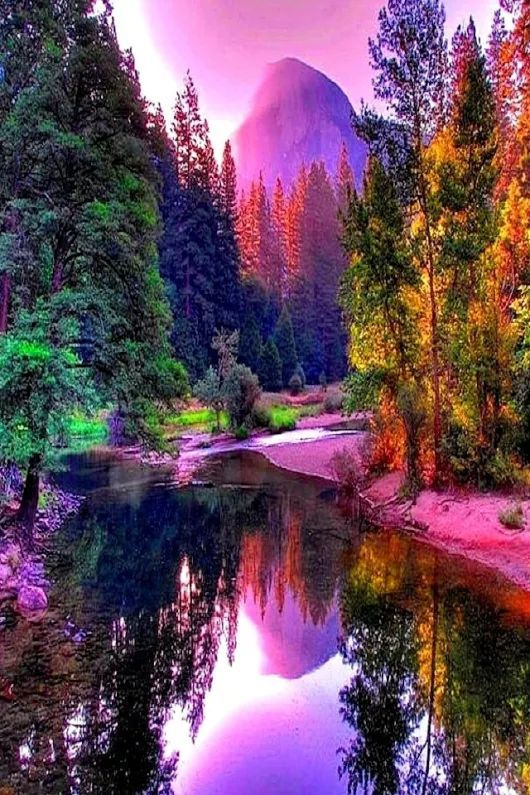

In [24]:
def reconstruir_imagen_color(imagen2_salida_gray_rojo, imagen2_salida_gray_verde, imagen2_salida_gray_azul):
    # Abrir las imágenes en escala de grises
    img1 = Image.open(imagen2_salida_gray_rojo).convert("L")
    img2 = Image.open(imagen2_salida_gray_verde).convert("L")
    img3 = Image.open(imagen2_salida_gray_azul).convert("L")

    # Crear una nueva imagen RGB con el mismo tamaño
    img2_color = Image.merge("RGB", (img1, img2, img3))

    # Devolver la imagen reconstruida
    return img2_color

# Ejemplo de uso
imagen_color = reconstruir_imagen_color("imagen2_salida_gray_rojo.jpg", "imagen2_salida_gray_verde.jpg", "imagen2_salida_gray_azul.jpg")
imagen_color


Reconstrucción de perro_salida_gray

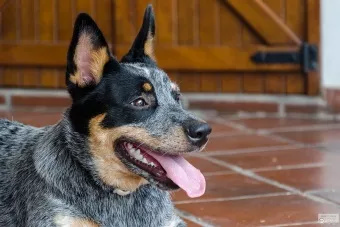

In [25]:
def reconstruir_imagen_color(perro_salida_gray_rojo, perro_salida_gray_verde, perro_salida_gray_azul):
    # Abrir las imágenes en escala de grises
    img1 = Image.open(perro_salida_gray_rojo).convert("L")
    img2 = Image.open(perro_salida_gray_verde).convert("L")
    img3 = Image.open(perro_salida_gray_azul).convert("L")

    # Crear una nueva imagen RGB con el mismo tamaño
    img3_color = Image.merge("RGB", (img1, img2, img3))

    # Devolver la imagen reconstruida
    return img3_color

# Ejemplo de uso
imagen_color = reconstruir_imagen_color("perro_salida_gray_rojo.jpg", "perro_salida_gray_verde.jpg", "perro_salida_gray_azul.jpg")
imagen_color


### Problema 3

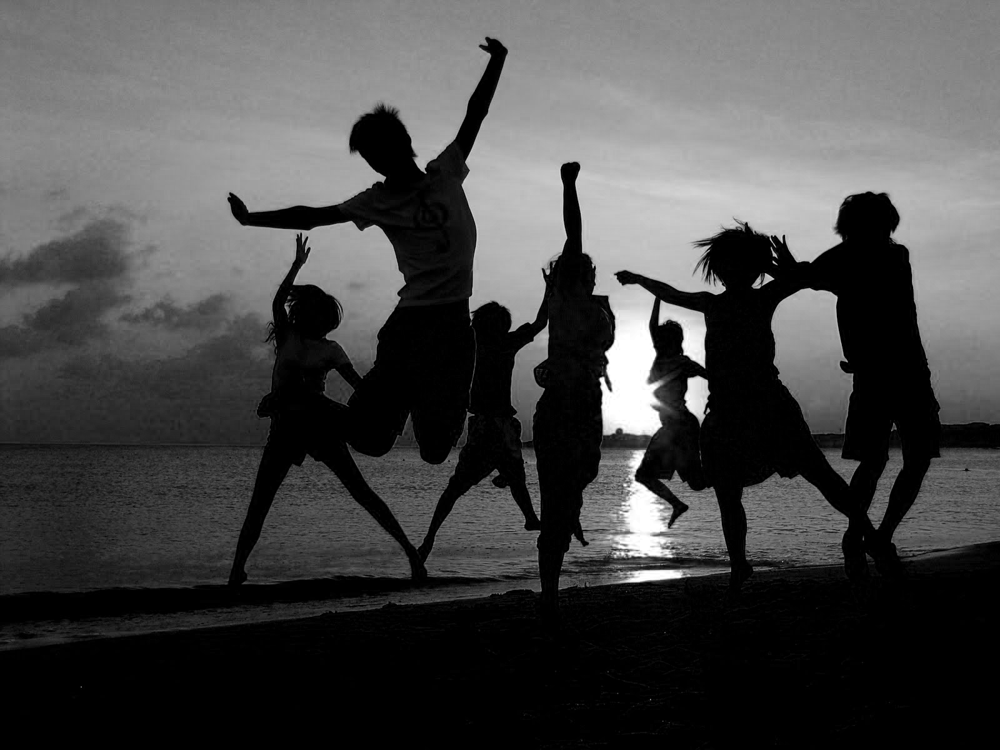

In [28]:
def crear_escala_grises_3d(imagen):
    # Abrir la imagen
    img = Image.open(imagen)
    # Convertir la imagen a RGB
    img = img.convert("RGB")
    # Obtener los datos de la imagen
    datos = img.load()

    # Crear imágenes en escala de grises para cada canal
    img_rojo = Image.new("L", img.size)
    img_verde = Image.new("L", img.size)
    img_azul = Image.new("L", img.size)

    datos_rojo = img_rojo.load()
    datos_verde = img_verde.load()
    datos_azul = img_azul.load()

    # Recorrer cada píxel de la imagen
    for y in range(img.size[1]):
        for x in range(img.size[0]):
            r, g, b = datos[x, y]
            datos_rojo[x, y] = r
            datos_verde[x, y] = g
            datos_azul[x, y] = b

    # Guardar las imágenes en escala de grises
    img_rojo.save("imagen_rojo.jpg")
    img_verde.save("imagen_verde.jpg")
    img_azul.save("imagen_azul.jpg")

    return img_rojo, img_verde, img_azul

# Ejemplo de uso
img_rojo, img_verde, img_azul = crear_escala_grises_3d("imagen.jpg")
img_rojo
img_verde
img_azul


### Problema 4

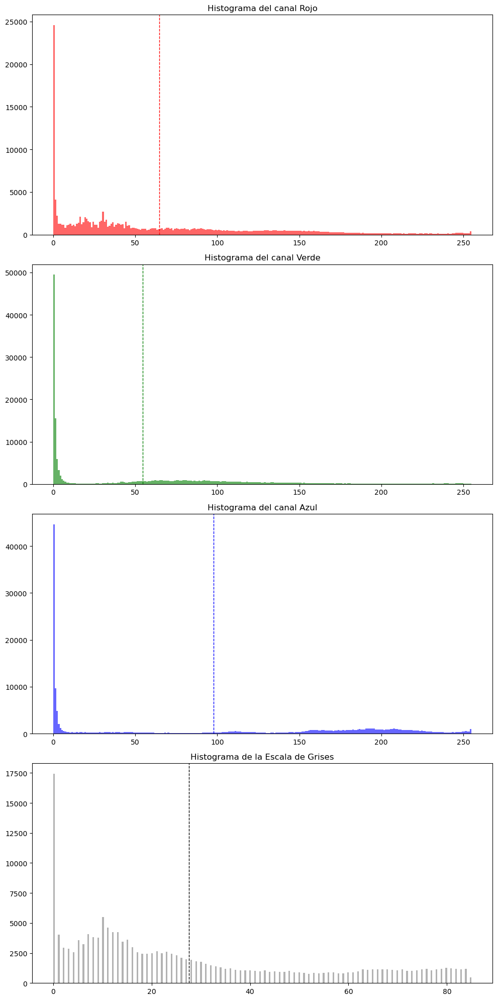

In [29]:
def mostrar_histogramas(imagen4):
    # Abrir la imagen
    img = Image.open(imagen4)
    # Convertir la imagen a RGB
    img = img.convert("RGB")
    # Obtener los datos de la imagen
    datos = np.array(img)

    # Separar los canales de color
    rojo = datos[:, :, 0].flatten()
    verde = datos[:, :, 1].flatten()
    azul = datos[:, :, 2].flatten()

    # Calcular la escala de grises usando el promedio aritmético
    gris = (rojo + verde + azul) // 3

    # Crear los histogramas
    fig, axs = plt.subplots(4, 1, figsize=(10, 20))

    # Histograma del canal rojo
    axs[0].hist(rojo, bins=256, color='red', alpha=0.6)
    axs[0].axvline(np.mean(rojo), color='red', linestyle='dashed', linewidth=1)
    axs[0].set_title('Histograma del canal Rojo')

    # Histograma del canal verde
    axs[1].hist(verde, bins=256, color='green', alpha=0.6)
    axs[1].axvline(np.mean(verde), color='green', linestyle='dashed', linewidth=1)
    axs[1].set_title('Histograma del canal Verde')

    # Histograma del canal azul
    axs[2].hist(azul, bins=256, color='blue', alpha=0.6)
    axs[2].axvline(np.mean(azul), color='blue', linestyle='dashed', linewidth=1)
    axs[2].set_title('Histograma del canal Azul')

    # Histograma de la escala de grises
    axs[3].hist(gris, bins=256, color='gray', alpha=0.6)
    axs[3].axvline(np.mean(gris), color='black', linestyle='dashed', linewidth=1)
    axs[3].set_title('Histograma de la Escala de Grises')

    plt.tight_layout()
    plt.show()

# Ejemplo de uso
mostrar_histogramas("imagen4.jpg")

#### Problema 5

##### ¿En qué consiste el enfoque de escala de grises ponderado?

El enfoque de escala de grises ponderado es una técnica utilizada en procesamiento de imágenes para convertir una imagen en color a una imagen en escala de grises. En lugar de simplemente promediar los valores de los canales de color (rojo, verde y azul), se asignan diferentes pesos a cada canal para reflejar mejor cómo el ojo humano percibe la luminosidad. Generalmente, el canal verde recibe el mayor peso, seguido del rojo y luego el azul, ya que el ojo humano es más sensible a la luz verde.

Una fórmula comúnmente utilizada para la conversión ponderada es:

Grayscale = 0.299 * R + 0.587 * G + 0.114 * B

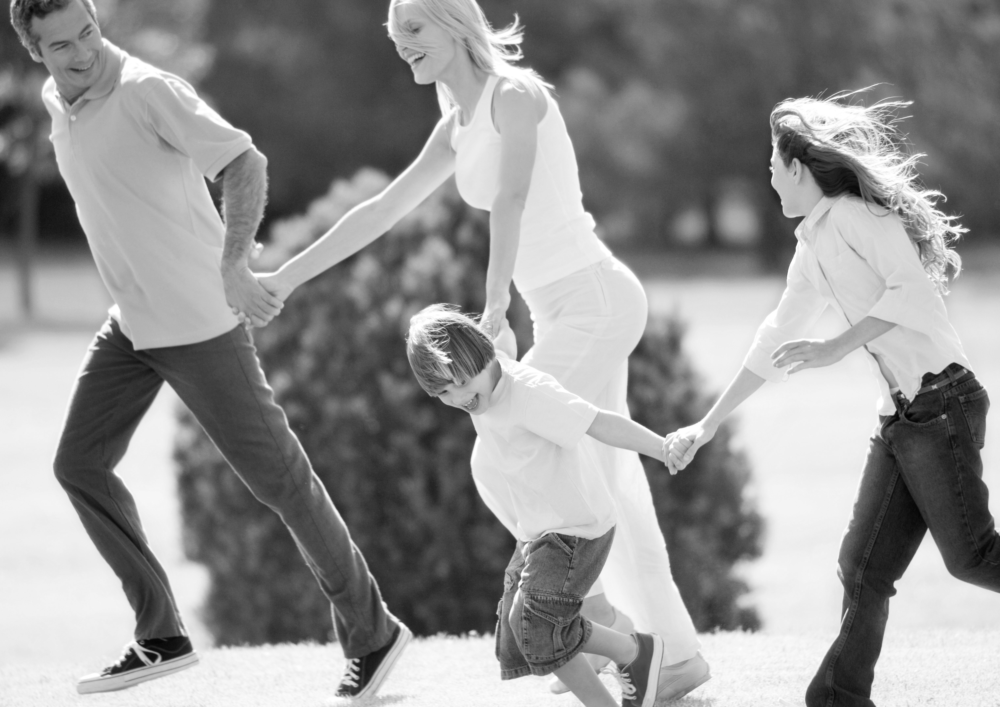

In [30]:
#Ejemplo
def escala_de_grises_ponderada(imagen_path):
    # Abrir la imagen
    imagen = Image.open(imagen_path)
    
    # Convertir la imagen a RGB si no lo está
    imagen = imagen.convert('RGB')
    
    # Obtener los datos de la imagen
    pixels = imagen.load()
    
    # Obtener las dimensiones de la imagen
    ancho, alto = imagen.size
    
    # Crear una nueva imagen en blanco y negro
    imagen_gris = Image.new('L', (ancho, alto))
    pixels_gris = imagen_gris.load()
    
    # Aplicar la fórmula de escala de grises ponderada
    for i in range(ancho):
        for j in range(alto):
            r, g, b = pixels[i, j]
            gris = int(0.299 * r + 0.587 * g + 0.114 * b)
            pixels_gris[i, j] = gris
    
    return imagen_gris

# Ejemplo de uso
imagen_gris = escala_de_grises_ponderada('imagen_path.jpg')
imagen_gris

#### Problema 6

##### ¿En qué consiste el espacio de color HSV y como se mapean colores a dicho espacio?

El espacio de color HSV (Hue, Saturation, Value) es un modelo de color que representa los colores de manera más intuitiva para los humanos en comparación con el espacio RGB.

#1. Hue (Tono): Representa el color puro y se mide en grados de 0 a 360 en el círculo cromático. Por ejemplo, 0° es rojo, 120° es verde y 240° es azul.

#2. Saturation (Saturación): Indica la intensidad o pureza del color, variando de 0 a 100%. Un 0% de saturación corresponde a un color gris (sin color), mientras que un 100% es el color más puro.

#3. Value (Valor): Representa la luminosidad del color, también variando de 0 a 100%. Un 0% de valor es completamente negro, mientras que un 100% es el color más brillante.

Para mapear colores del espacio RGB al espacio HSV, se utilizan fórmulas matemáticas que transforman los valores de los canales rojo, verde y azul en los componentes de tono, saturación y valor.

In [32]:
#Ejemplo
def rgb_a_hsv(r, g, b):
    r, g, b = r / 255.0, g / 255.0, b / 255.0
    max_val = max(r, g, b)
    min_val = min(r, g, b)
    delta = max_val - min_val

    # Calcular Hue
    if delta == 0:
        h = 0
    elif max_val == r:
        h = (60 * ((g - b) / delta) + 360) % 360
    elif max_val == g:
        h = (60 * ((b - r) / delta) + 120) % 360
    elif max_val == b:
        h = (60 * ((r - g) / delta) + 240) % 360

    # Calcular Saturation
    s = 0 if max_val == 0 else (delta / max_val)

    # Calcular Value
    v = max_val

    return h, s * 100, v * 100

# Ejemplo de uso
h, s, v = rgb_a_hsv(255, 0, 0)  # Rojo puro
print(f"Hue: {h}, Saturation: {s}%, Value: {v}%")

Hue: 0.0, Saturation: 100.0%, Value: 100.0%


Alumno: Catherine Alvarez
Carné: 14005664